<a href="https://colab.research.google.com/github/pawandahal/Ecommerce/blob/main/progromming_for_data_analaysis_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:


import pandas as pd

# Step 1: Load and concatenate data from multiple CSV files
file_paths = [
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Aotizhongxin_20130301-20170228.csv',
    "/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Changping_20130301-20170228.csv",
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv',
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Dongsi_20130301-20170228.csv',
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Guanyuan_20130301-20170228.csv',
]
dataframes = [pd.read_csv(file) for file in file_paths]
df = pd.concat(dataframes)


In [ ]:
# Step 2: Get an overview of the data
print("Number of rows and columns:", df.shape)
print("\nData Types and Non-null Counts:")
df.info()
print("\nFirst Few Rows of the Dataset:")
print(df.head())
print("\nSummary Statistics:")
print(df.describe())

Number of rows and columns: (175320, 18)

Data Types and Non-null Counts:
<class 'pandas.core.frame.DataFrame'>
Index: 175320 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       175320 non-null  int64  
 1   year     175320 non-null  int64  
 2   month    175320 non-null  int64  
 3   day      175320 non-null  int64  
 4   hour     175320 non-null  int64  
 5   PM2.5    171476 non-null  float64
 6   PM10     172382 non-null  float64
 7   SO2      171890 non-null  float64
 8   NO2      170136 non-null  float64
 9   CO       165061 non-null  float64
 10  O3       169946 non-null  float64
 11  TEMP     175154 non-null  float64
 12  PRES     175160 non-null  float64
 13  DEWP     175154 non-null  float64
 14  RAIN     175158 non-null  float64
 15  wd       174800 non-null  object 
 16  WSPM     175192 non-null  float64
 17  station  175320 non-null  object 
dtypes: float64(11), int64(5), object(2)


In [ ]:
# Step 3: Check for missing values
missing_values = df.isnull().sum()
print("\nMissing Values in Each Column Before Handling:")
print(missing_values[missing_values > 0])


Missing Values in Each Column Before Handling:
PM2.5     3844
PM10      2938
SO2       3430
NO2       5184
CO       10259
O3        5374
TEMP       166
PRES       160
DEWP       166
RAIN       162
wd         520
WSPM       128
dtype: int64


In [ ]:
# Step 4: Handle Missing Values
for column in df.columns:
    if df[column].dtype in ['float64', 'int64']:
        df[column] = df[column].interpolate(method='linear')
    elif df[column].dtype == 'object':
        mode_value = df[column].mode()[0]
        df[column] = df[column].fillna(mode_value)

total_missing_after = df.isnull().sum().sum()
print("\nTotal Missing Values After Handling:", total_missing_after)



Total Missing Values After Handling: 0


In [ ]:
# Step 5: Check for duplicates before removal
duplicates_before = df.duplicated().sum()
print("\nNumber of Duplicates Before Removal:\n", duplicates_before)



Number of Duplicates Before Removal:
 0


In [ ]:
# Step 6: Remove duplicates
df.drop_duplicates(inplace=True)

# Verify duplicates have been removed
duplicates_after = df.duplicated().sum()
print("Number of Duplicates After Removal:\n", duplicates_after)  # Should be 0


Number of Duplicates After Removal:
 0


In [ ]:
# Step 7: Feature Engineering - Create a datetime column if date information is available
if {'year', 'month', 'day', 'hour'}.issubset(df.columns):
    df['datetime'] = pd.to_datetime(df[['year', 'month', 'day', 'hour']])
    df.set_index('datetime', inplace=True)


In [ ]:
print("\nData after Preprocessing:")


Data after Preprocessing:


In [ ]:

# Step 8: Standardize column names
df.columns = [col.lower().replace(" ", "_") for col in df.columns]


In [ ]:
print("Number of rows and columns:\n", df.shape)

Number of rows and columns:
 (175320, 18)


In [ ]:
# Step 9: Handle Outliers (Example: Removing outliers in PM2.5 and other pollutant columns)
pollutant_columns = [col for col in df.columns if 'pm' in col or 'pollutant' in col]


In [ ]:
print("Missing values in the final dataset:\n", df.isnull().sum().sum())

Missing values in the final dataset:
 0


In [ ]:
for col in pollutant_columns:
    df = df[df[col] <= 500]  # Example threshold; adjust as per data specifics


In [ ]:
print("Sample data:\n", df.head())

Sample data:
                      no  year  month  day  hour  pm2.5  pm10   so2   no2  \
datetime                                                                   
2013-03-01 00:00:00   1  2013      3    1     0    4.0   4.0   4.0   7.0   
2013-03-01 01:00:00   2  2013      3    1     1    8.0   8.0   4.0   7.0   
2013-03-01 02:00:00   3  2013      3    1     2    7.0   7.0   5.0  10.0   
2013-03-01 03:00:00   4  2013      3    1     3    6.0   6.0  11.0  11.0   
2013-03-01 04:00:00   5  2013      3    1     4    3.0   3.0  12.0  12.0   

                        co    o3  temp    pres  dewp  rain   wd  wspm  \
datetime                                                                
2013-03-01 00:00:00  300.0  77.0  -0.7  1023.0 -18.8   0.0  NNW   4.4   
2013-03-01 01:00:00  300.0  77.0  -1.1  1023.2 -18.2   0.0    N   4.7   
2013-03-01 02:00:00  300.0  73.0  -1.1  1023.5 -18.2   0.0  NNW   5.6   
2013-03-01 03:00:00  300.0  72.0  -1.4  1024.5 -19.4   0.0   NW   3.1   
2013-03-01 04:0

In [ ]:
# Statistical Summary
summary = df.describe(include='all')  # Include all data types
print(summary)

                   no           year          month            day  \
count   174469.000000  174469.000000  174469.000000  174469.000000   
unique            NaN            NaN            NaN            NaN   
top               NaN            NaN            NaN            NaN   
freq              NaN            NaN            NaN            NaN   
mean     17510.713445    2014.659974       6.524317      15.724920   
std      10120.481899       1.177065       3.441482       8.790515   
min          1.000000    2013.000000       1.000000       1.000000   
25%       8750.000000    2014.000000       4.000000       8.000000   
50%      17496.000000    2015.000000       7.000000      16.000000   
75%      26290.000000    2016.000000      10.000000      23.000000   
max      35064.000000    2017.000000      12.000000      31.000000   

                 hour          pm2.5           pm10            so2  \
count   174469.000000  174469.000000  174469.000000  174469.000000   
unique            N

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Univariate Analysis: Histograms
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

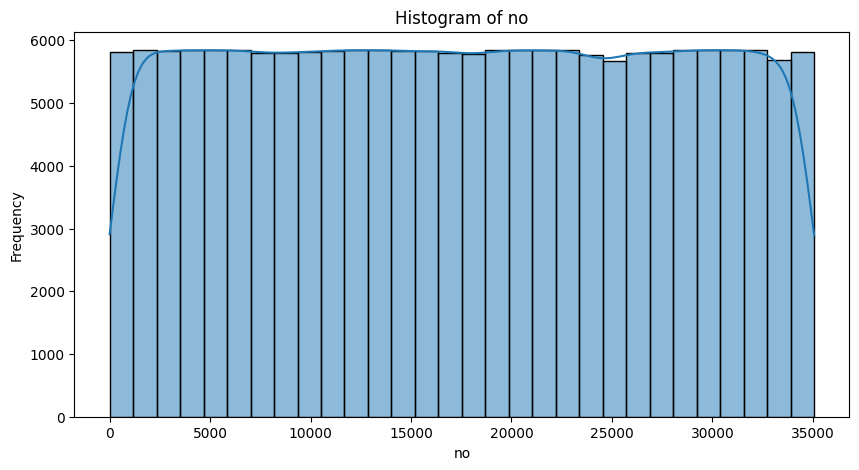

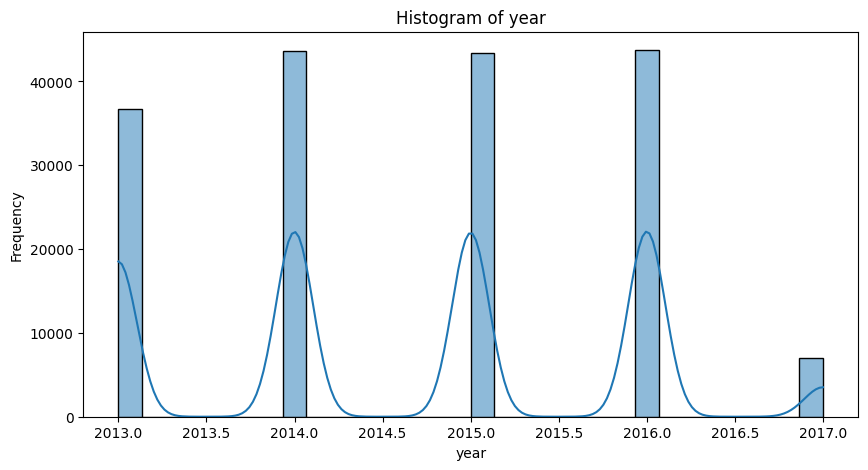

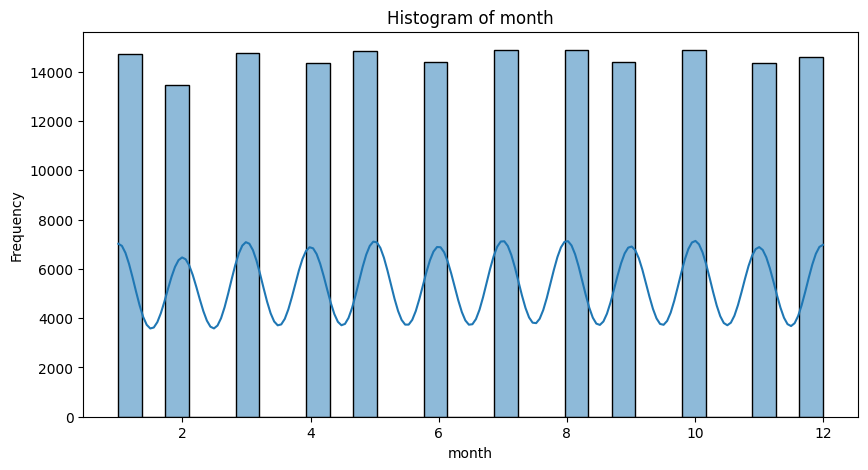

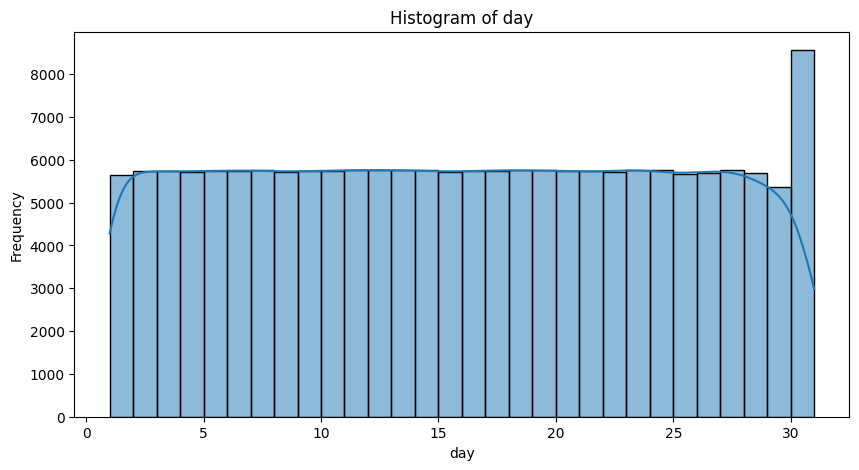

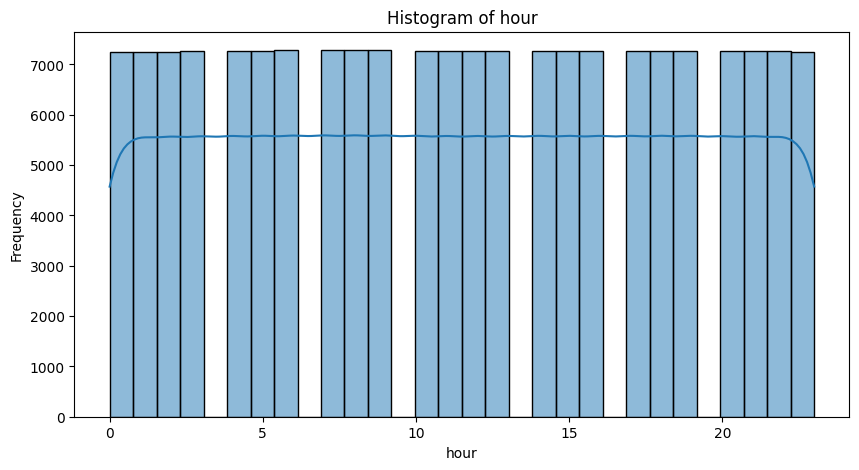

...

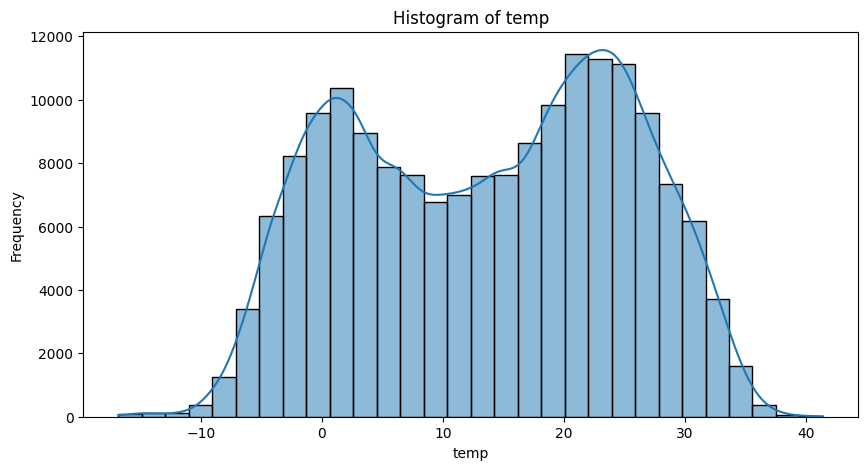

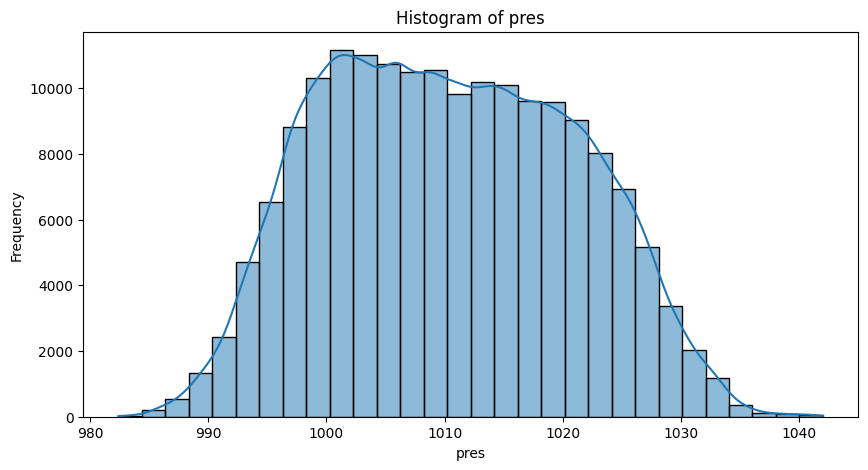

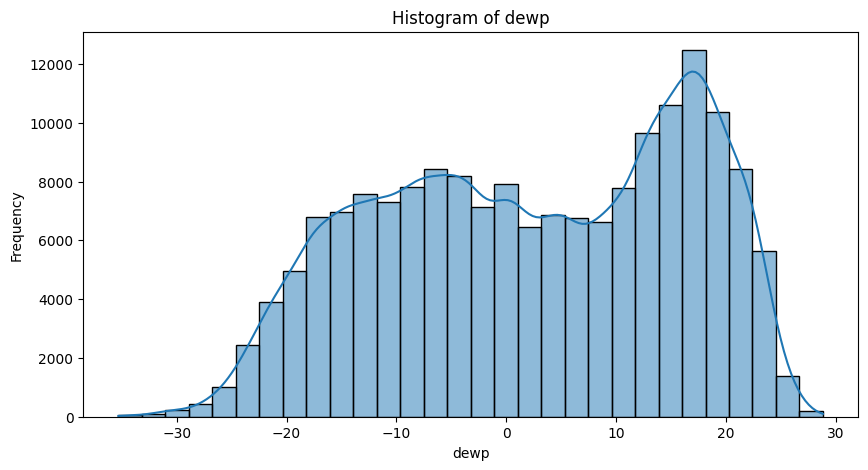

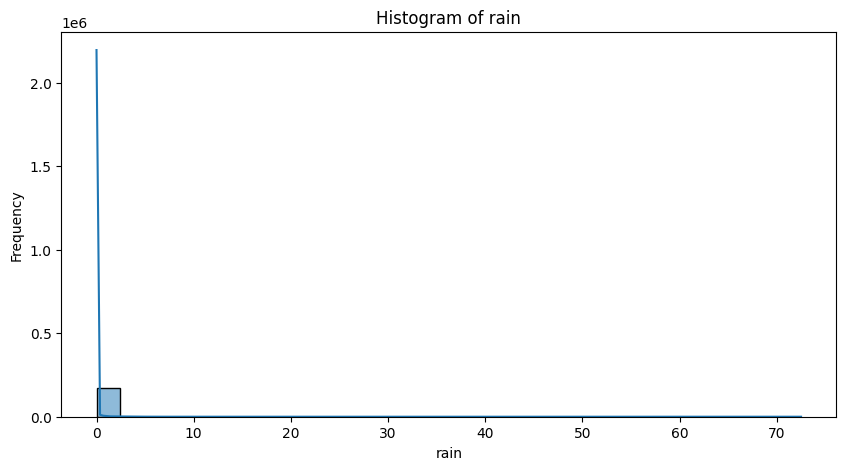

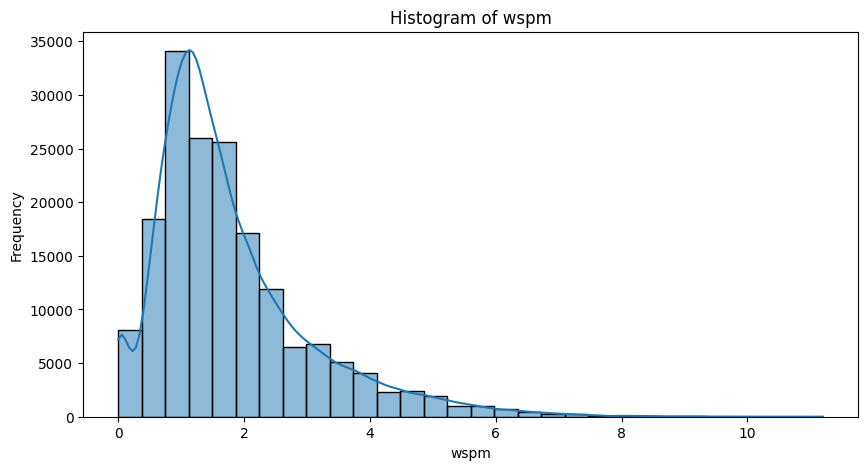

In [ ]:
for column in numeric_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[column], bins=30, kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

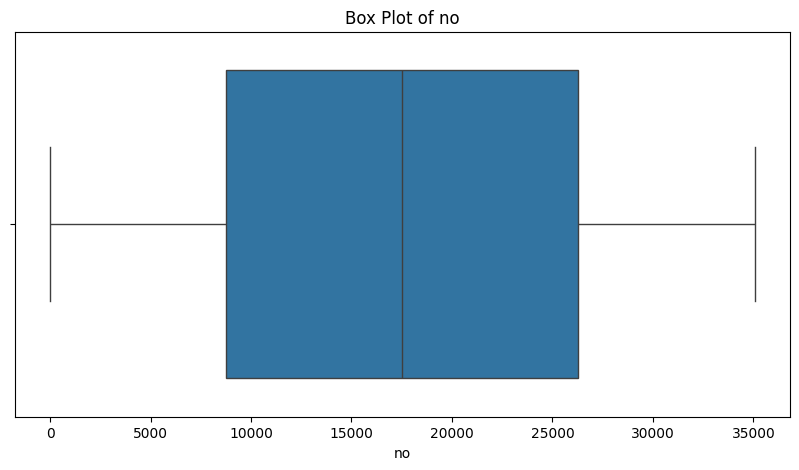

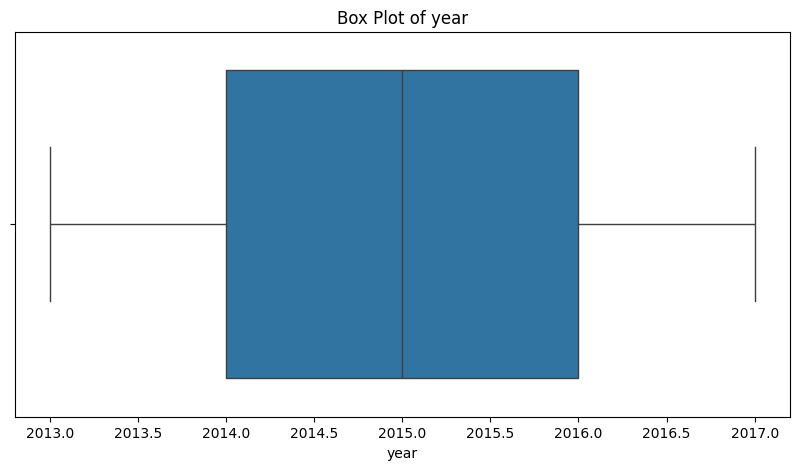

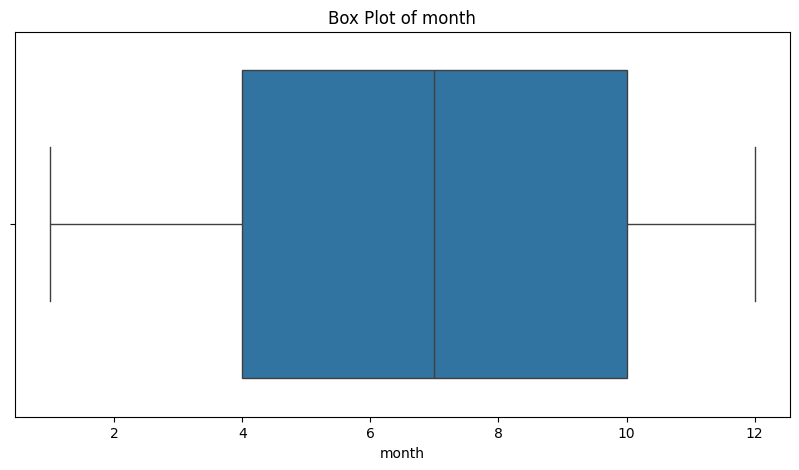

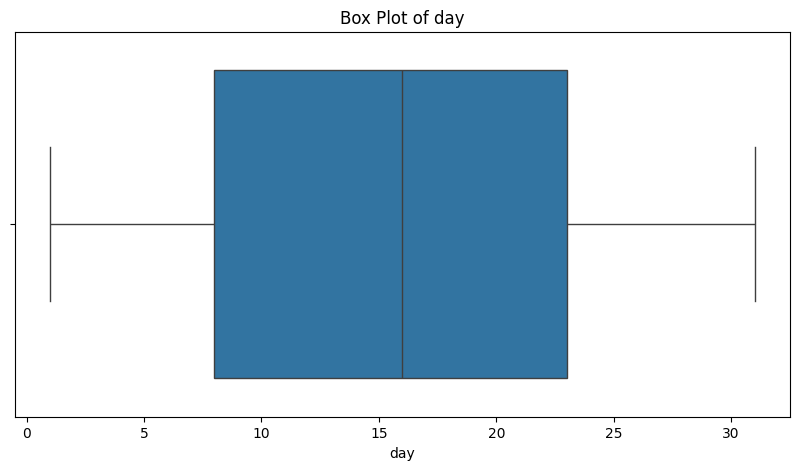

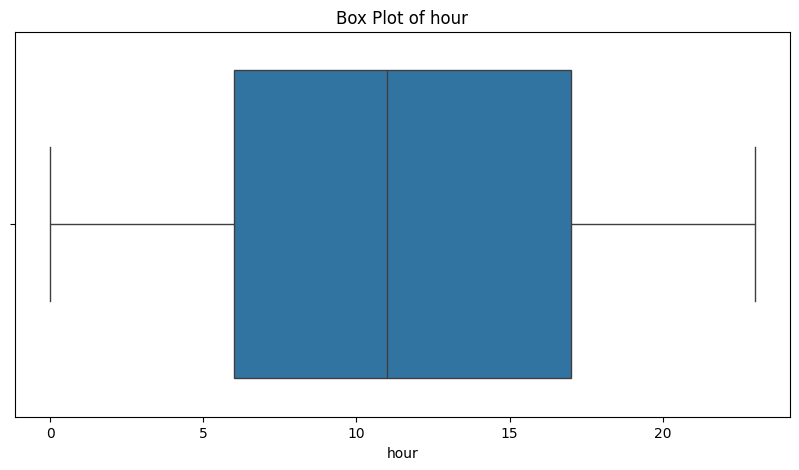

...

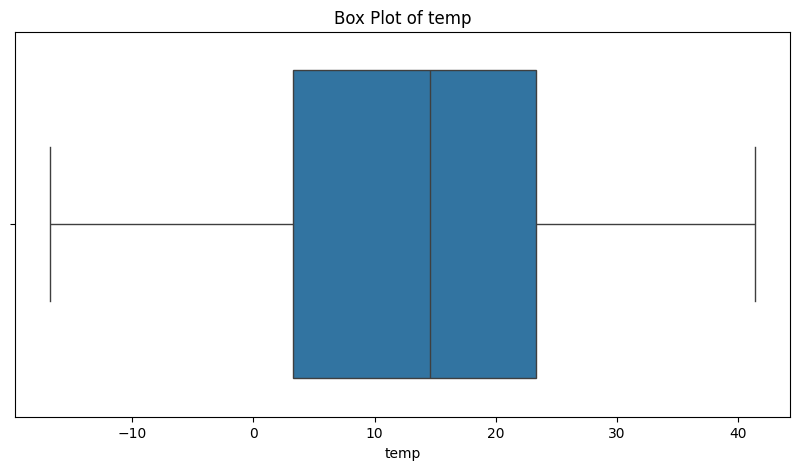

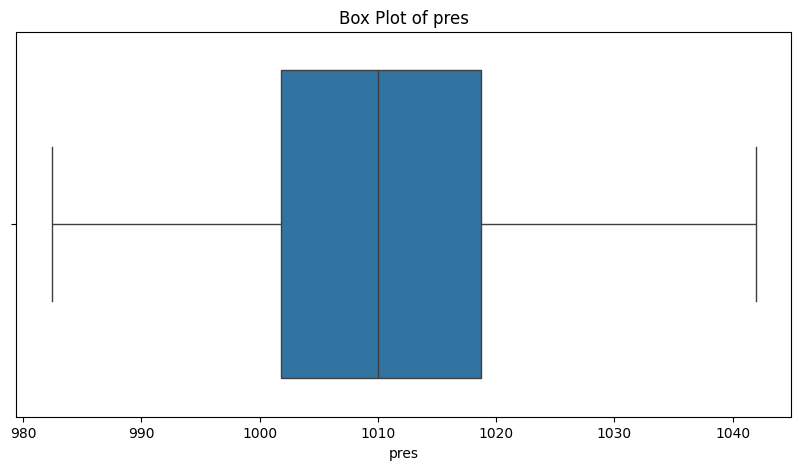

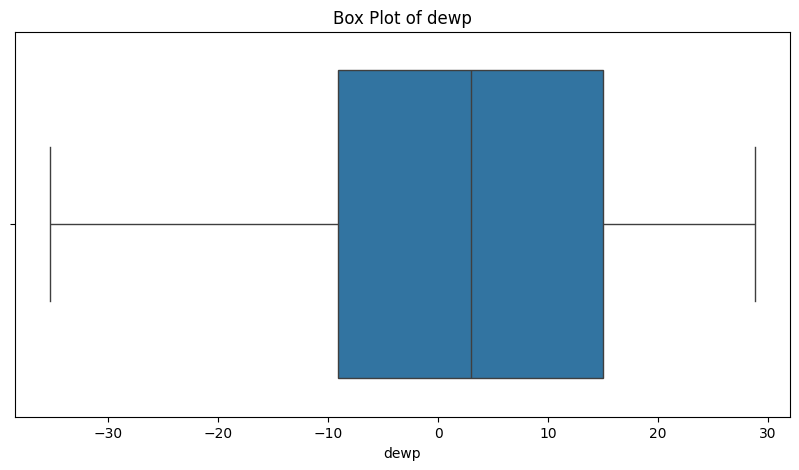

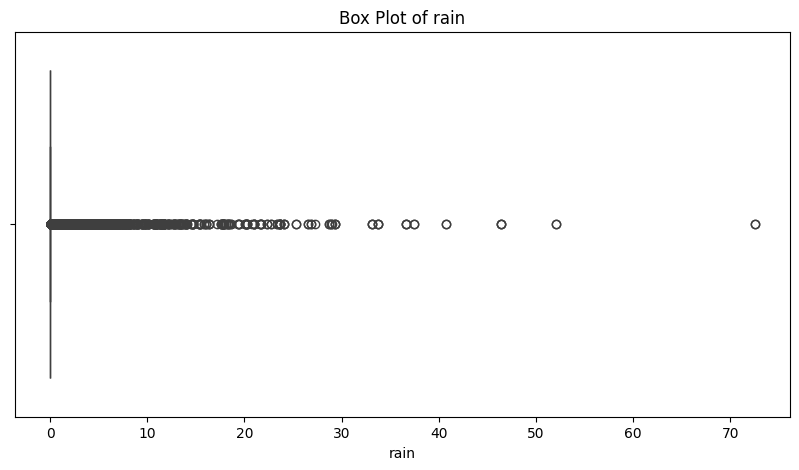

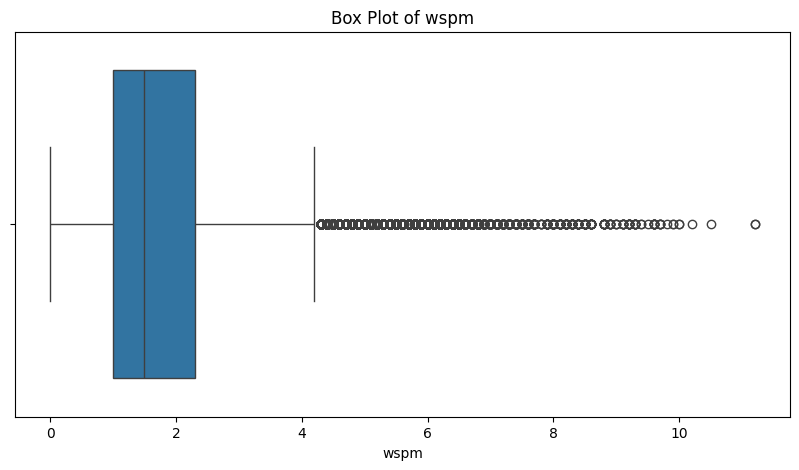

In [ ]:
# Box Plots for Outlier Detection
for column in numeric_columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
    plt.show()

In [ ]:
x_column = 'pm2.5'  # Replace with your actual column name
y_column = 'pm10'    # Replace with your actual column name



In [ ]:
# Check for numeric columns
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
print("Numeric columns:", numeric_columns)

Numeric columns: Index(['no', 'year', 'month', 'day', 'hour', 'pm2.5', 'pm10', 'so2', 'no2',
       'co', 'o3', 'temp', 'pres', 'dewp', 'rain', 'wspm'],
      dtype='object')


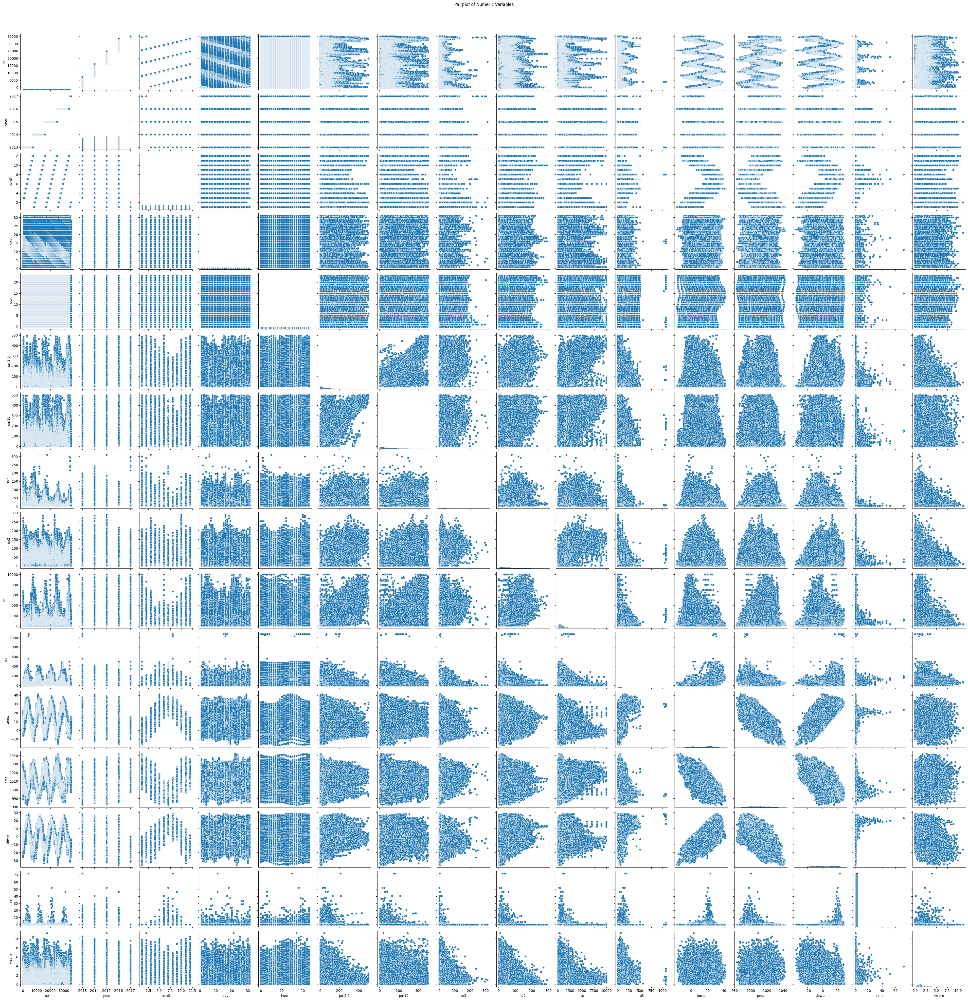

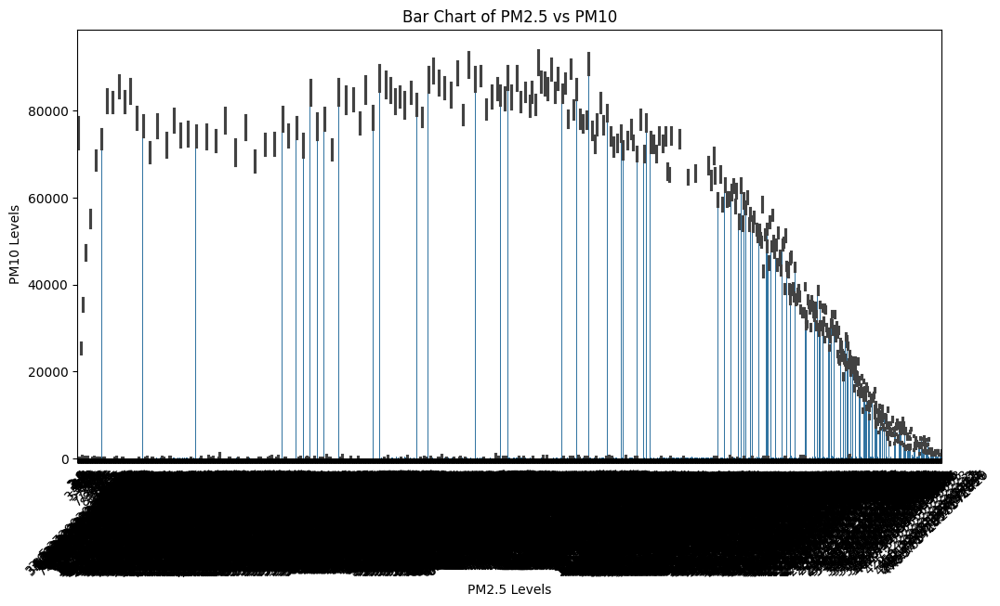

In [ ]:

sns.pairplot(df[numeric_columns])
plt.suptitle('Pairplot of Numeric Variables', y=1.02)
plt.show()


x_column = 'pm2.5'
y_column = 'pm10'    # Replace with your actual column name

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x=x_column, y=y_column, estimator=sum)
plt.title('Bar Chart of PM2.5 vs PM10')
plt.xticks(rotation=45)
plt.xlabel('PM2.5 Levels')
plt.ylabel('PM10 Levels')
plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-2-c3ea0a90cb78>:20: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.fillna(method='ffill', inplace=True)


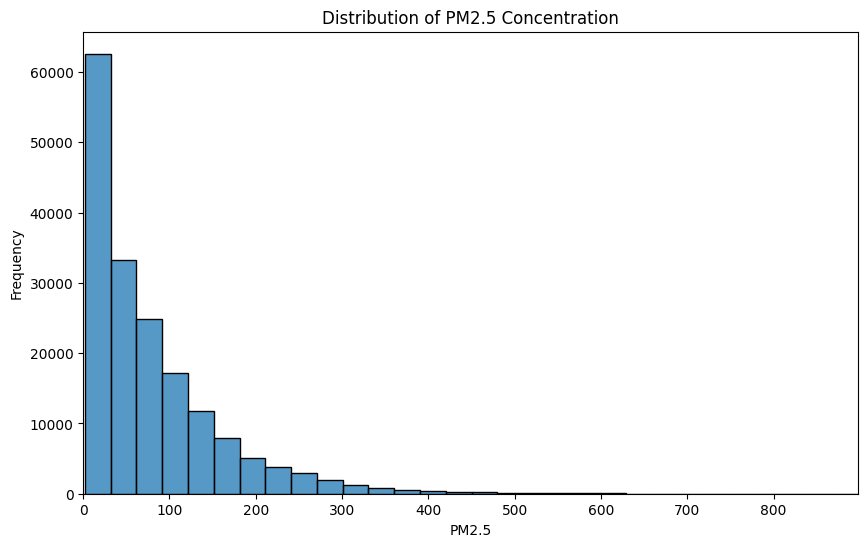

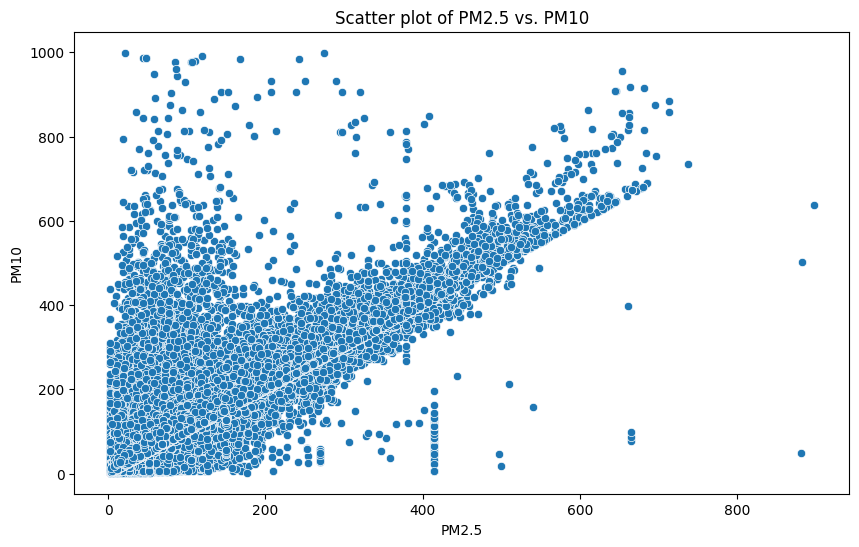

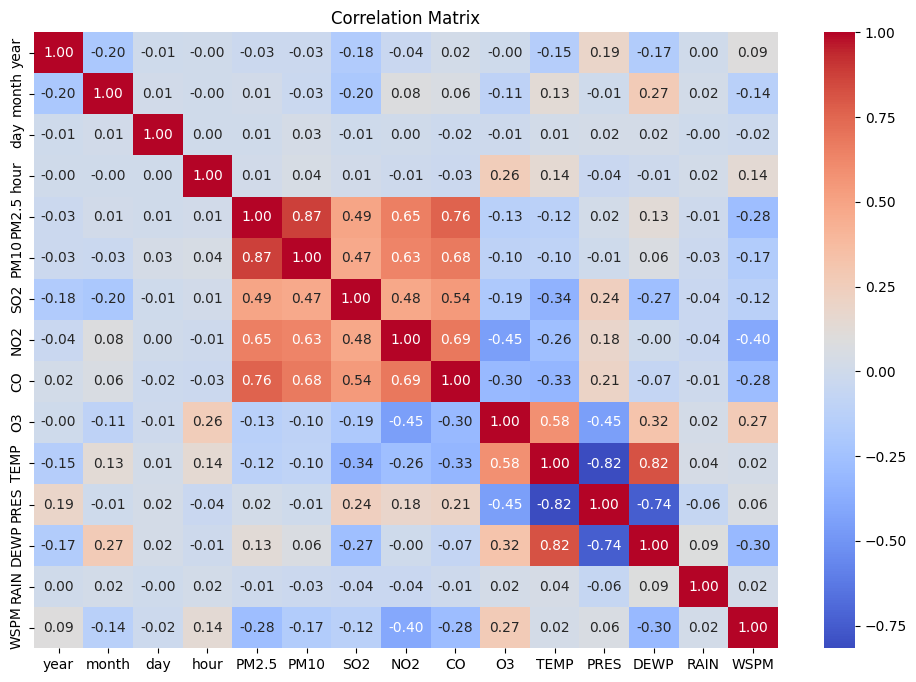

Mean Squared Error: 391.98
R² Score: 0.94


In [2]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Data Handling Functions
def load_and_merge_data(file_paths):
    dataframes = [pd.read_csv(file) for file in file_paths]
    combined_df = pd.concat(dataframes, ignore_index=True)
    return combined_df

def handle_missing_and_duplicates(df):
    df.fillna(method='ffill', inplace=True)
    df.drop_duplicates(inplace=True)
    return df

def feature_engineering(df):
    if 'date' in df.columns:
        df['date'] = pd.to_datetime(df['date'])
        df['year'] = df['date'].dt.year
        df['month'] = df['date'].dt.month
        df['day'] = df['date'].dt.day
        df['season'] = df['month'].apply(lambda x: 'Spring' if 3 <= x <= 5 else 'Summer' if 6 <= x <= 8 else 'Fall' if 9 <= x <= 11 else 'Winter')
    return df

def data_cleaning(df):
    if 'No' in df.columns:
        df.drop('No', axis=1, inplace=True)
    for col in df.select_dtypes(include=['object']).columns:
        df[col] = df[col].astype('category')
    return df

def perform_analysis_and_visualization(df):
    pm25_clean = df['PM2.5'].dropna()
    plt.figure(figsize=(10, 6))
    sns.histplot(pm25_clean, bins=30)
    plt.title('Distribution of PM2.5 Concentration')
    plt.xlabel('PM2.5')
    plt.ylabel('Frequency')
    plt.xlim([0, pm25_clean.max()])
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='PM2.5', y='PM10', data=df.dropna(subset=['PM2.5', 'PM10']))
    plt.title('Scatter plot of PM2.5 vs. PM10')
    plt.xlabel('PM2.5')
    plt.ylabel('PM10')
    plt.show()

    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    corr_matrix = df[numeric_columns].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Matrix')
    plt.show()

def model_training_and_prediction(df):
    df = df.dropna(subset=['PM2.5'])
    X = df.drop(columns=['PM2.5'])
    y = df['PM2.5']
    X = pd.get_dummies(X, drop_first=True)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return mse, r2, model

# File paths for the air quality data
file_paths = [
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Aotizhongxin_20130301-20170228.csv',
    "/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Changping_20130301-20170228.csv",
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv',
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Dongsi_20130301-20170228.csv',
    '/content/drive/MyDrive/st20310459/P_data_analysis_st20310459/beijing+multi+site+air+quality+data/PRSA2017_Data_20130301-20170228/PRSA_Data_20130301-20170228/PRSA_Data_Guanyuan_20130301-20170228.csv',
]

# Load and merge the data
data = load_and_merge_data(file_paths)

# Handle missing values and duplicates
data = handle_missing_and_duplicates(data)

# Feature engineering
data = feature_engineering(data)

# Data cleaning
data = data_cleaning(data)

# Perform EDA
perform_analysis_and_visualization(data)

# Train model and predict
mse, r2, model = model_training_and_prediction(data)

# Print the results
print(f"Mean Squared Error: {mse:.2f}")
print(f"R² Score: {r2:.2f}")
